# Phần 1: Biểu diễn ảnh màu và ảnh xám

## Khai báo sẵn

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import requests
from pathlib import Path
from pprint import pprint

#HÀM LẤY ẢNH TỪ URL
def get_image_from_url(url):
  response = requests.get(url)
  if response.status_code != 200:
    raise Exception('Lỗi tải ảnh xuống')
  image_np = np.frombuffer(response.content, np.uint8)
  image = cv2.imdecode(image_np, cv2.IMREAD_COLOR)
  return image

#HÀM XUẤT ẢNH XỬ LÝ LỆCH HỆ MÀU GIỮA THƯ VIỆN CV2 (BGR) VÀ MATPLOTLIB (RGB)
def show_image(title, img):
  plt.figure(figsize=(6, 6))
  #Kiểm tra là ảnh màu 3 lớp hay là ảnh xám
  if len(img.shape) == 3:
    #Nếu là ảnh màu 3 lớp
    img_result = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_result)
  else:
    #Nếu là ảnh xám 2 chiều, dùng bảng màu xám cmap='gray'
    plt.imshow(img, cmap='gray')

  plt.title(title, fontsize=12, fontweight='bold', color='darkblue')
  plt.axis('off')
  plt.show()

## 1.1 Load ảnh
Tải danh sách các ảnh từ URL để thực hiện xử lý hàng loạt

In [2]:
#Danh sách ảnh
urls = ['https://unsplash.com/photos/dvhnglDPcYI/download?force=true',
        'https://unsplash.com/photos/Ji3yQIhI4bg/download?force=true',
        'https://cdn.sanity.io/images/nxpteyfv/goguides/56c6da0e58db640fff86af4198b7f6a527377cdd-1600x1066.jpg',
        ]

images = []

#Tạo thư mục lưu ảnh
INPATH = Path('./Images') / 'input'
INPATH.mkdir(parents=True, exist_ok=True)

#Lưu ảnh vào thư mục
for i, url in enumerate(urls):
  image = get_image_from_url(url)
  try:
    cv2.imwrite(INPATH / f'image_{i}.jpg', image)
  except Exception as e:
    raise Exception(f'Lỗi lưu ảnh số {i}')

  images.append(image)
  print(f'Image_{i}: {image.shape}')


Image_0: (6000, 3368, 3)
Image_1: (5795, 3863, 3)
Image_2: (1066, 1600, 3)


## 1.2. Chuyển từ ảnh màu sang ảnh xám
Thực hiện chuyển đổi ảnh gốc sang thang độ xám (Grayscale) và thử phục hồi lại không gian màu.

**Mục tiêu:** Kiểm chứng lý thuyết về việc mất thông tin màu sắc khi chuyển đổi.

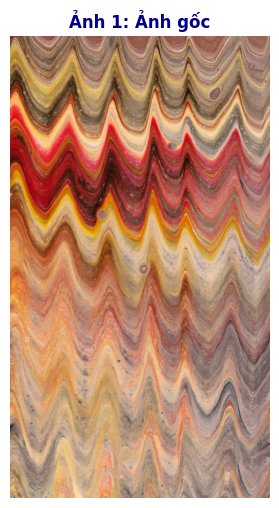

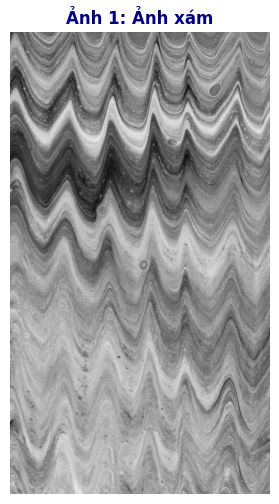

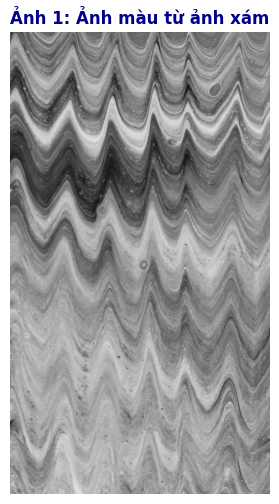

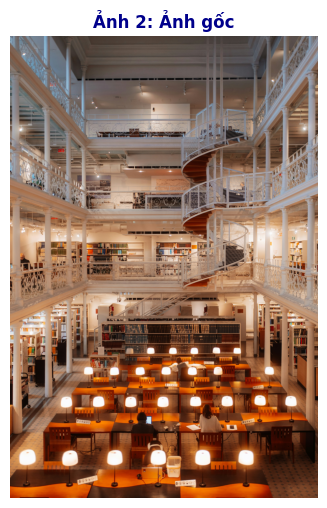

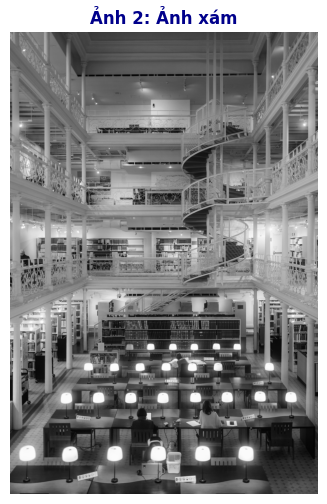

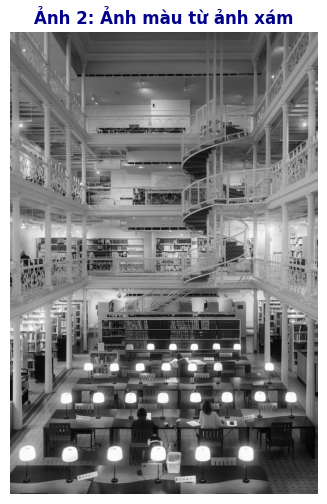

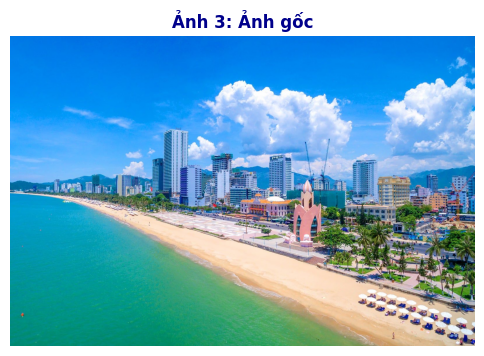

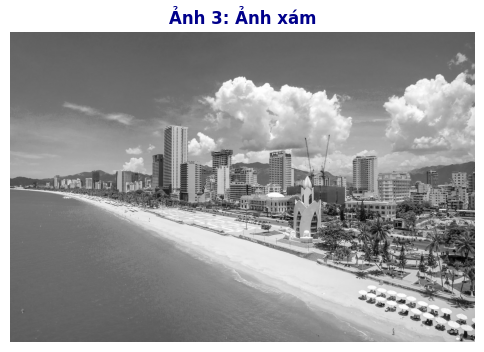

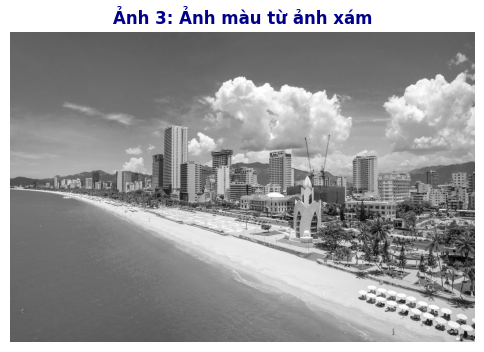

In [3]:
for i, img in enumerate(images):

  #XUẤT ẢNH GỐC
  show_image(f"Ảnh {i+1}: Ảnh gốc",img)

  #CHUYỂN SANG ẢNH XÁM
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  show_image(f"Ảnh {i+1}: Ảnh xám",img_gray)

  #CHUYỂN ẢNH XÁM SANG ẢNH MÀU
  img_gray2color = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)
  show_image(f"Ảnh {i+1}: Ảnh màu từ ảnh xám", img_gray2color)

## 1.3 Tách riêng từng kênh màu (R, G, B)

Tách ảnh gốc thành 3 kênh riêng biệt: **Blue - Green - Red**.
Mỗi kênh được hiển thị dưới dạng cường độ sáng (Intensity Map):
* Vùng sáng (Trắng): Thể hiện cường độ màu đó mạnh.
* Vùng tối (Đen): Thể hiện cường độ màu đó yếu.


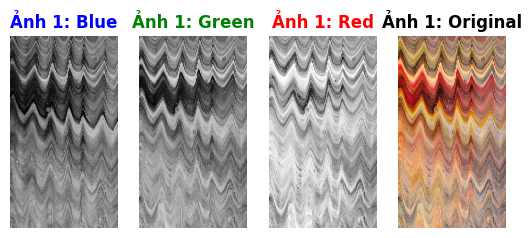

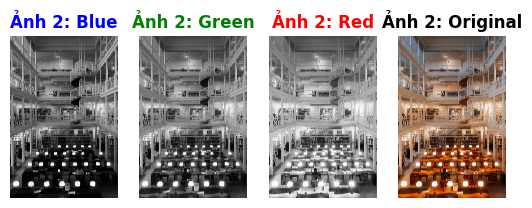

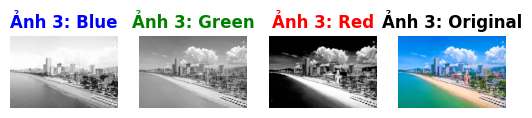

In [4]:
image_splits = []

for i, image in enumerate(images):
    b, g, r = cv2.split(image)

    image_splits.append({'blue': b, 'green': g, 'red': r})


    # BLUE
    plt.subplot(1, 4, 1)
    plt.imshow(b, cmap='gray')
    plt.title(f"Ảnh {i+1}: Blue", fontweight='bold', color='blue')
    plt.axis('off')

    # GREEN
    plt.subplot(1, 4, 2)
    plt.imshow(g, cmap='gray')
    plt.title(f"Ảnh {i+1}: Green", fontweight='bold', color='green')
    plt.axis('off')

    # RED
    plt.subplot(1, 4, 3)
    plt.imshow(r, cmap='gray')
    plt.title(f"Ảnh {i+1}: Red", fontweight='bold', color='red')
    plt.axis('off')

    # ẢNH GỐC
    plt.subplot(1, 4, 4)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Ảnh {i+1}: Original", fontweight='bold')
    plt.axis('off')
    plt.show()

## 1.4 Kết hợp các kênh màu

### 1.4.1 Tái tạo lại ảnh màu ban đầu.
Sử dụng hàm `cv2.merge()` để gộp 3 kênh tín hiệu đơn lẻ (Blue, Green, Red) thành một ảnh màu hoàn chỉnh.

**Mục tiêu:** Kiểm tra tính toàn vẹn của dữ liệu sau khi tách và gộp (Lossless reconstruction).

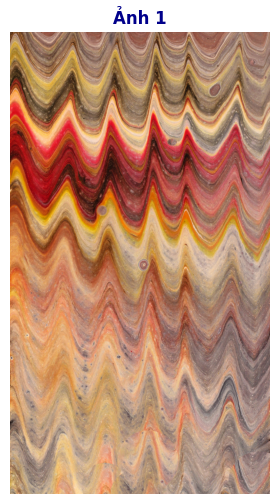

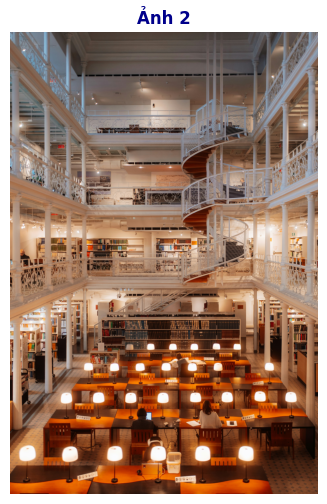

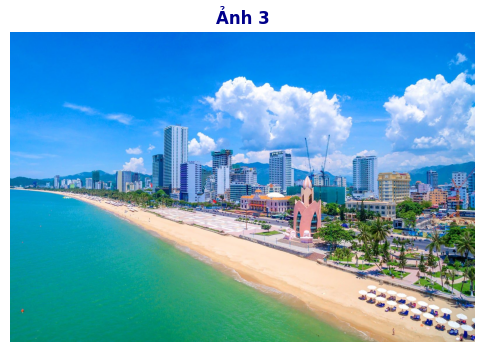

In [5]:
for i, img in enumerate(image_splits):
  image_reconstructed = cv2.merge([img['blue'], img['green'], img['red']])
  show_image(f"Ảnh {i+1}", image_reconstructed)

### 1.4.2 Tạo ảnh mới.


Tạo ra các ảnh màu mới bằng cách hoán đổi, thay thế hoặc kết hợp các kênh


#### Hoán đổi kênh
Thực hiện hoán đổi vị trí giữa kênh **Red** và kênh **Green**.
* **Ảnh gốc:** Blue - Green - Red (BGR)
* **Ảnh mới:** Blue - Red - Green (BRG)

**Kết quả:** Các vật thể màu đỏ sẽ chuyển thành xanh lá và ngược lại.

Swap color red and green


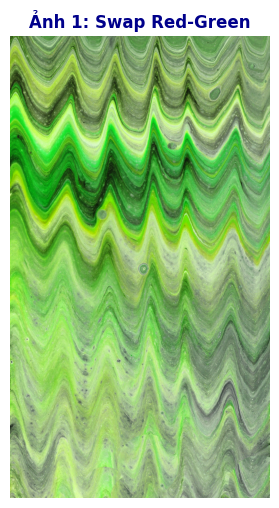

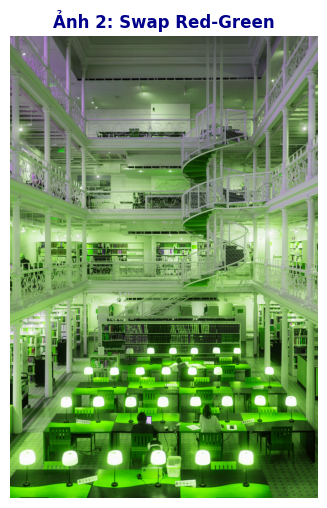

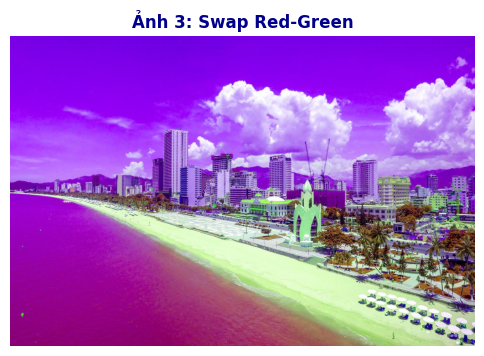

In [6]:
print('Swap color red and green')
for i, img in enumerate(image_splits):
  image_swap = cv2.merge([img['blue'], img['red'], img['green']])
  show_image(f"Ảnh {i+1}: Swap Red-Green", image_swap)

#### Thị giác của chó (Dog Vision)
Loài chó có thị giác lưỡng sắc (dichromatic vision), chúng thiếu tế bào nón cảm nhận màu Đỏ và Xanh lá riêng biệt.

**Thuật toán:**
1.  Giữ nguyên kênh Blue.
2.  Gộp kênh Red và Green thành một màu trung bình (Vàng/Nâu).

**Kết quả:** Thế giới qua mắt chó chỉ bao gồm các tông màu Xanh dương và Vàng.

Thị giác của chó (Mù màu Đỏ - Xanh, nên hình ảnh chỉ còn Biển và Vàng).


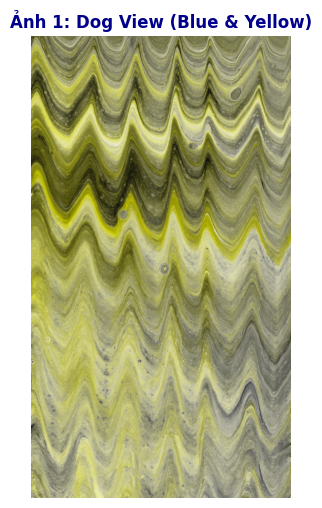

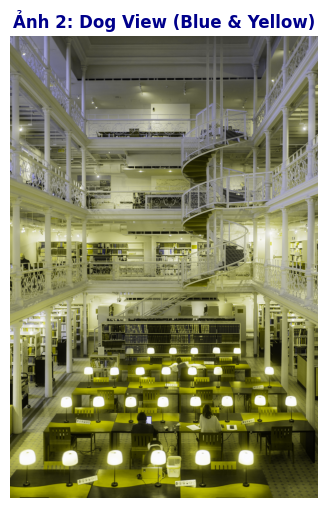

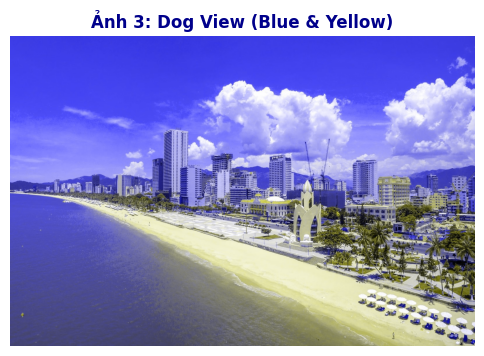

In [7]:
print('Thị giác của chó (Mù màu Đỏ - Xanh, nên hình ảnh chỉ còn Biển và Vàng).')
for i, img in enumerate(image_splits):
  g = img['green']
  r = img['red']

  # Ép kiểu sang float để cộng không bị giới hạn 255
  g_float = g.astype(float)
  r_float = r.astype(float)


  yellow_img = ((g_float + r_float) / 2).astype(np.uint8)
  image_dog = cv2.merge([img['blue'], yellow_img, yellow_img])

  show_image(f"Ảnh {i+1}: Dog View (Blue & Yellow)", image_dog)


#### Hiệu ứng Loại bỏ kênh màu Xanh Biển
Loại bỏ hoàn toàn thông tin của kênh **Blue** (gán giá trị bằng 0).
* **Công thức:** `Merge([0, Green, Red])`

* **Kết quả:** Ảnh sẽ bị ám màu Vàng (màu Vintage).

* **Lý do:** Trong hệ màu cộng, Ánh sáng Trắng - Xanh Dương = Màu Vàng (Yellow).

Lọc màu xanh biển, màu đỏ và xanh lá sẽ thành màu Vàng theo nguyên tắc cộng màu ánh sáng


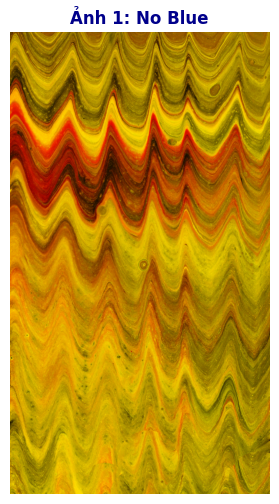

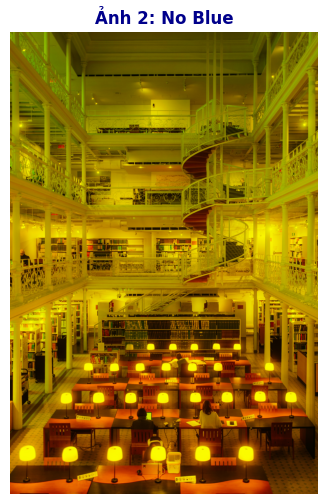

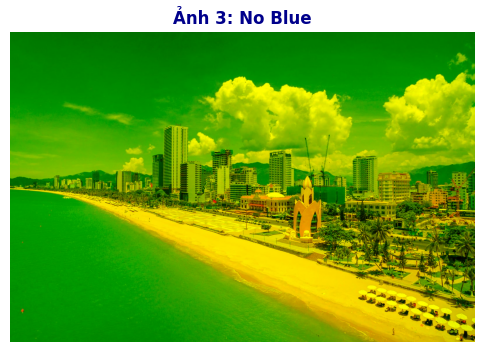

In [8]:
print('Lọc màu xanh biển, màu đỏ và xanh lá sẽ thành màu Vàng theo nguyên tắc cộng màu ánh sáng')
for i, img in enumerate(image_splits):

  image_no_blue = cv2.merge([np.zeros_like(img['blue']),
                    img['green'],
                    img['red']])
  show_image(f"Ảnh {i+1}: No Blue", image_no_blue)

# Phần 2: Image Filtering (Low-pass & High-pass)

## 2.1. Low-pass Filter (Smoothing Filter)

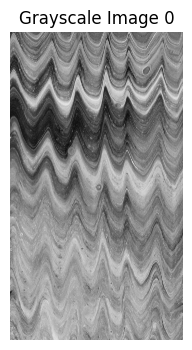

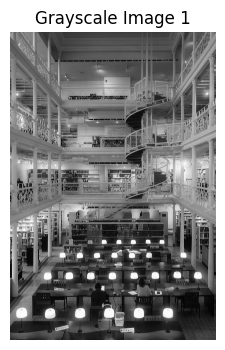

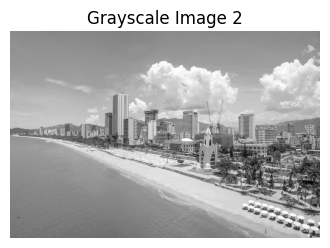

In [9]:
grays = []  # lưu danh sách ảnh xám

for i, img in enumerate(images):
    # Nếu ảnh màu (H, W, 3) chuyển sang GRAY
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img.copy()

    grays.append(gray)

    plt.figure(figsize=(4,4))
    plt.imshow(gray, cmap='gray')
    plt.title(f"Grayscale Image {i}")
    plt.axis("off")

In [ ]:
# Hàm hỗ trợ hiển thị ảnh
def show_results(title, images, cmap='gray'):
    plt.figure(figsize=(15, 4))
    for i, (name, img) in enumerate(images):
        plt.subplot(1, len(images), i+1)
        plt.imshow(img, cmap=cmap)
        plt.title(name)
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

### 2.1.1. Mean Filter

Mean filter (average filter) thực hiện bằng cách thay thế giá trị mỗi điểm ảnh bằng giá trị trung bình của các điểm ảnh lân cận trong một cửa sổ kernel kích thước cố định.

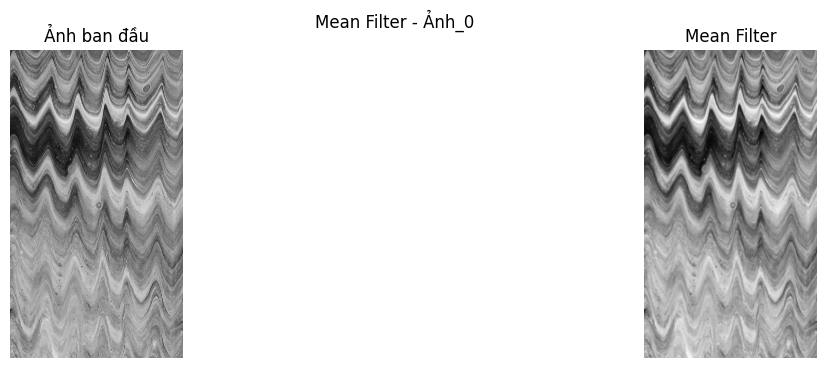

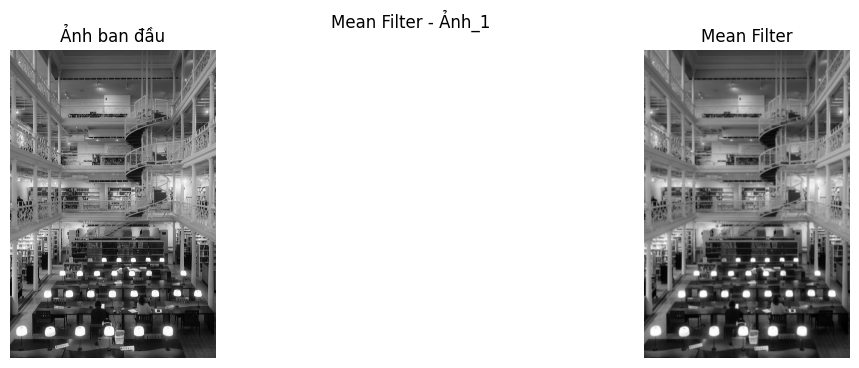

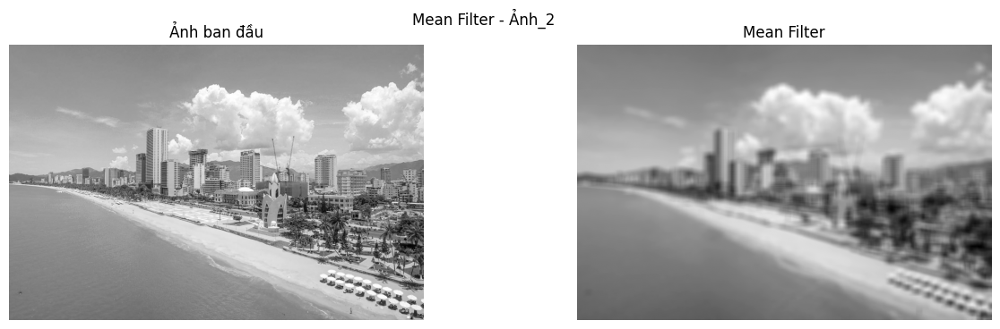

In [ ]:
# Danh sách lưu kết quả sau khi áp dụng Mean Filter
mean_results = []

# Kích thước kernel (K x K)
# Kernel càng lớn thì hiệu ứng làm trơn càng mạnh
K_SIZE = 25

# Tạo kernel Mean (Average kernel)
# Mỗi phần tử có giá trị bằng 1 / (K_SIZE * K_SIZE)
kernel_mean = np.ones((K_SIZE, K_SIZE), np.float32) / (K_SIZE * K_SIZE)

# Áp dụng Mean Filter cho từng ảnh xám
for i, gray in enumerate(grays):
    # Gán tên cho từng ảnh
    name = f"Ảnh_{i}"
    # Thực hiện phép tích chập (convolution) với kernel mean
    mean_img = cv2.filter2D(gray, -1, kernel_mean)
    mean_results.append((name, gray, mean_img))
    
# Hiển thị kết quả:
for name, original, mean_img in mean_results:
    show_results(
        f"Mean Filter - {name}",
        [
            ("Ảnh ban đầu", original),
            ("Mean Filter", mean_img)
        ]
    )

Đặc điểm của mean filter:
- Ảnh sau khi lọc trở nên mượt hơn so với ảnh gốc.
- Nhiễu ngẫu nhiên được giảm đáng kể.
- Các biên và chi tiết nhỏ bị làm mờ rõ rệt, đặc biệt khi kích thước kernel lớn.
- Mean filter phù hợp cho việc làm trơn ảnh nhưng không thích hợp khi cần bảo toàn biên.

### 2.1.2. Gaussian Filter
Gaussian filter là một dạng low-pass filter sử dụng phân bố Gaussian để gán trọng số cho các điểm ảnh lân cận, trong đó các điểm gần tâm kernel có ảnh hưởng lớn hơn.

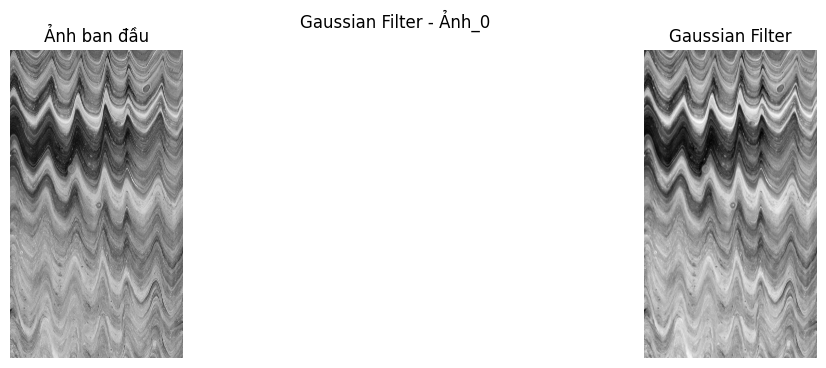

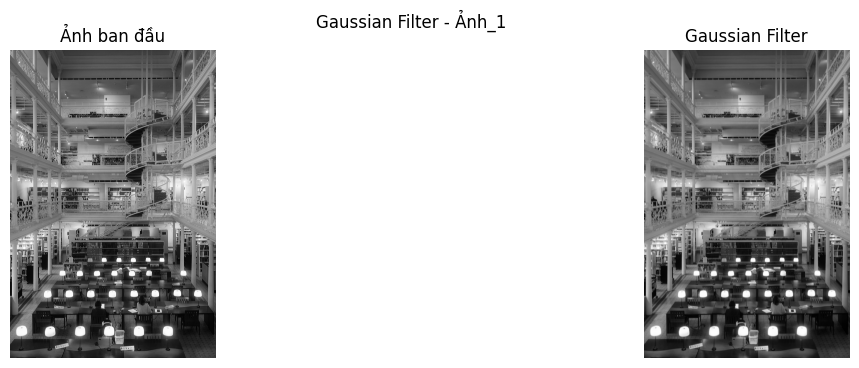

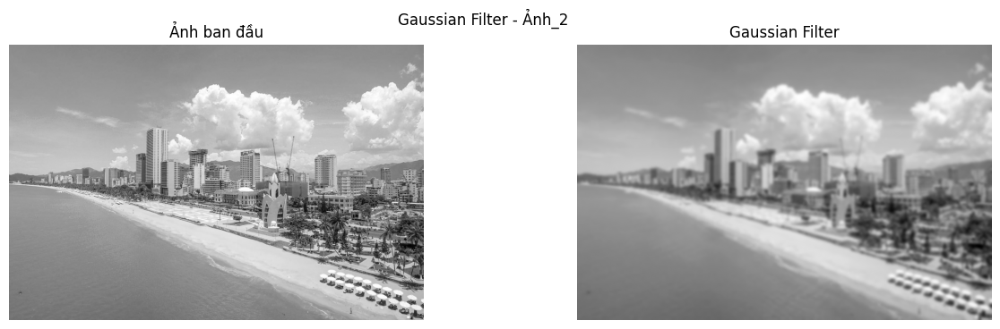

In [ ]:
# Danh sách lưu kết quả sau khi áp dụng Gaussian Filter
gaussian_results = []

# Áp dụng Gaussian Filter cho từng ảnh xám
for i, gray in enumerate(grays):
    # Gán tên cho từng ảnh
    name = f"Ảnh_{i}"
    # Thực hiện Gaussian Blur với Kernel kích thước (25 x 25) và độ lệch chuẩn sigmaX = 5.0
    gaussian_img = cv2.GaussianBlur(gray, (25, 25), sigmaX=5.0)
    gaussian_results.append((name, gray, gaussian_img))
    
# Hiển thị kết quả:
for name, original, gaussian_img in gaussian_results:
    show_results(
        f"Gaussian Filter - {name}",
        [
            ("Ảnh ban đầu", original),
            ("Gaussian Filter", gaussian_img)
        ]
    )

Nhận xét:
- Ảnh sau lọc mượt hơn nhưng ít bị méo biên so với Mean filter.
- Nhiễu được giảm hiệu quả trong khi vẫn giữ được cấu trúc tổng thể của ảnh.
- Gaussian filter cho kết quả tự nhiên hơn và thường được ưu tiên trong thực tế.

### 2.1.3. Median Filter

Median filter là một bộ lọc low-pass phi tuyến, trong đó giá trị của mỗi điểm ảnh được thay thế bằng giá trị trung vị (median) của các điểm ảnh trong vùng lân cận. 

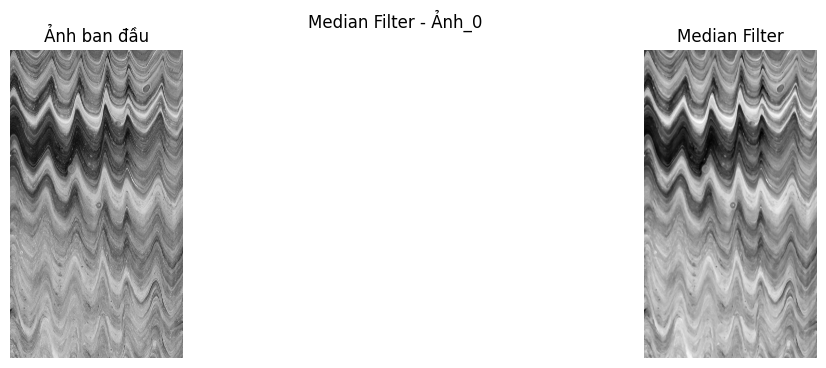

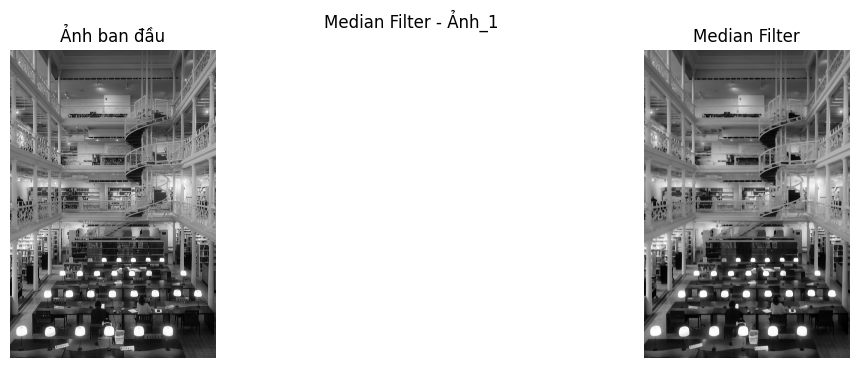

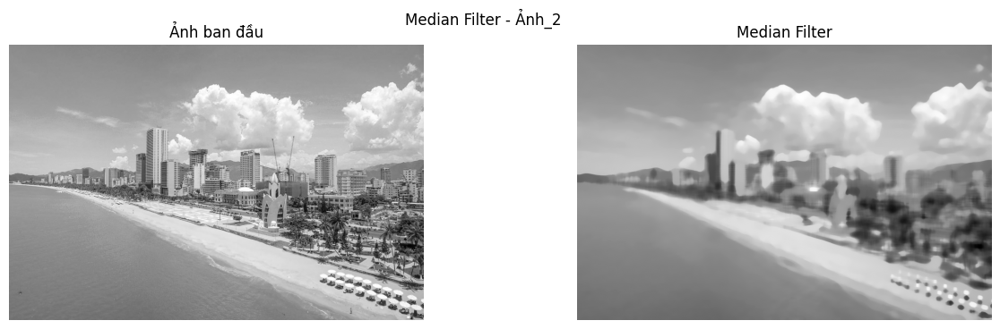

In [ ]:
# Danh sách lưu kết quả sau khi áp dụng Median Filter
median_results = []

# Áp dụng Median Filter cho từng ảnh xám
for i, gray in enumerate(grays):
    # Gán tên cho từng ảnh
    name = f"Ảnh_{i}"
    # Thực hiện Median Blur kích thước cửa sổ lọc là 25
    median_img = cv2.medianBlur(gray, 25)
    median_results.append((name, gray, median_img))
for name, original, median_img in median_results:
    show_results(
        f"Median Filter - {name}",
        [
            ("Ảnh ban đầu", original),
            ("Median Filter", median_img)
        ]
    )

## 2.2. High-pass Filtering

High-pass filtering là nhóm các phép lọc nhằm làm nổi bật các thành phần tần số cao trong ảnh, đặc biệt là biên và các chi tiết nhỏ. Các vùng có sự thay đổi cường độ mạnh sẽ được nhấn mạnh, trong khi các vùng phẳng hoặc biến thiên chậm sẽ bị suy giảm.

### 2.2.1. Laplacian Filter

Laplacian filter là bộ lọc high-pass dựa trên đạo hàm bậc hai, có khả năng phát hiện biên theo mọi hướng.

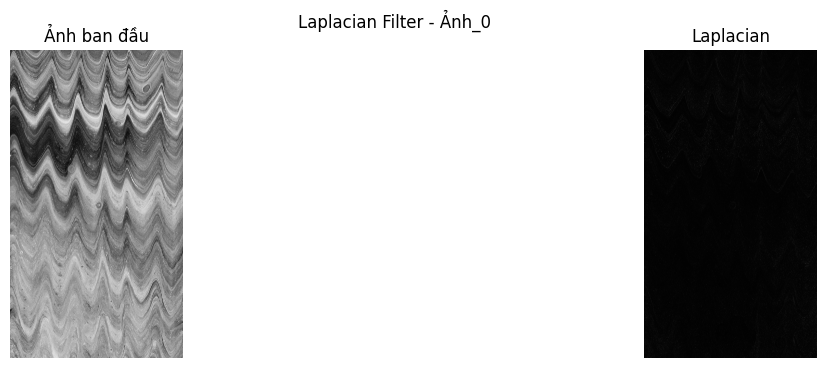

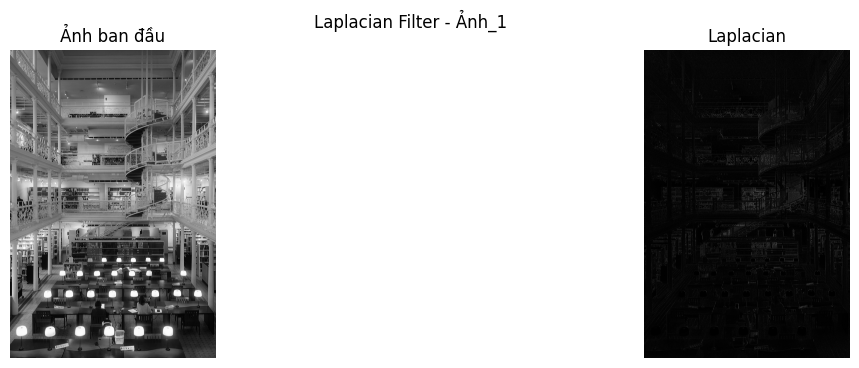

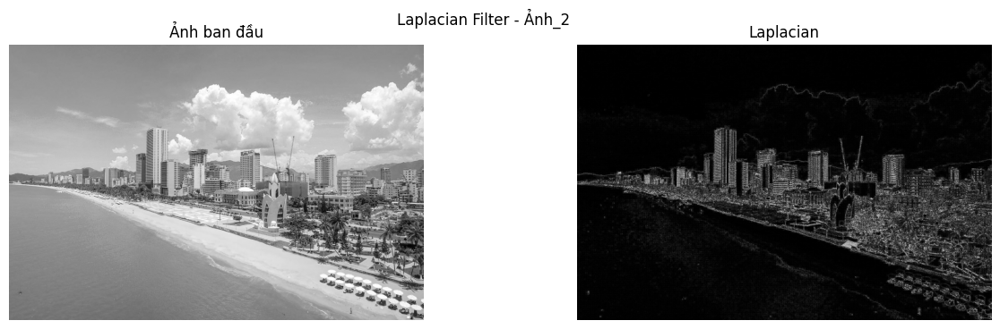

In [ ]:
# Danh sách lưu kết quả sau khi áp dụng Laplacian Filter
laplacian_results = []

# Áp dụng Laplacian Filter cho từng ảnh xám
for i, gray in enumerate(grays):
    # Gán tên cho từng ảnh
    name = f"Ảnh_{i}"
    # Thực hiện Laplacian Filter 
    lap = cv2.Laplacian(gray, cv2.CV_64F)
    # Chuyển kết quả về dạng 8-bit
    lap = cv2.convertScaleAbs(lap)
    laplacian_results.append((name, gray, lap))
    
# Hiển thị kết quả:
for name, original, lap in laplacian_results:
    show_results(
        f"Laplacian Filter - {name}",
        [
            ("Ảnh ban đầu", original),
            ("Laplacian", lap)
        ]
    )


Nhận xét:
- Các biên và chi tiết nhỏ được làm nổi bật rõ rệt.
- Các vùng phẳng trong ảnh có giá trị gần bằng 0.
- Laplacian rất nhạy với nhiễu, đặc biệt khi ảnh đầu vào chưa được làm trơn.
- Bộ lọc này phù hợp cho việc làm nổi chi tiết nhưng thường cần kết hợp với low-pass filter trước đó.

### 2.2.2. Sobel filter

Sobel filter là bộ lọc high-pass dựa trên đạo hàm bậc nhất, cho phép phát hiện biên theo các hướng cụ thể (ngang và dọc).

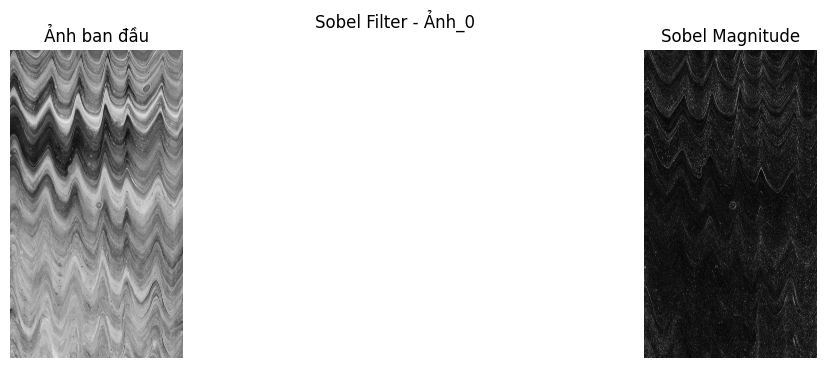

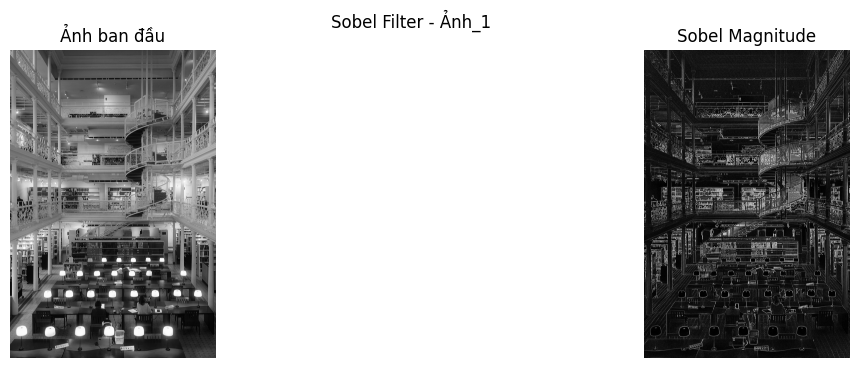

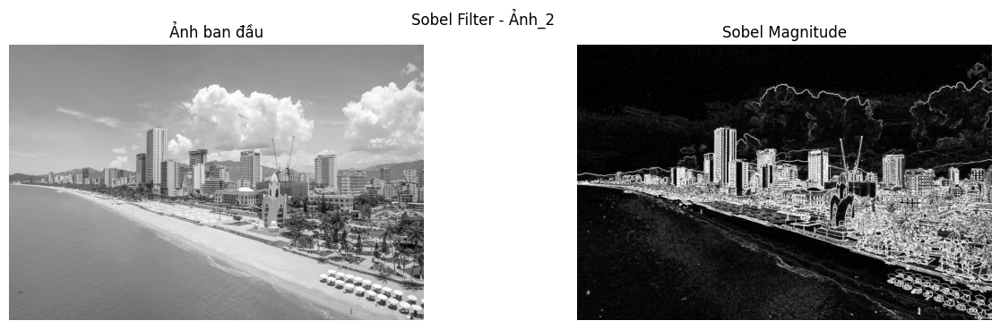

In [ ]:
# Danh sách lưu kết quả sau khi áp dụng Sobel Filter
sobel_results = []

# Áp dụng Sobel Filter cho từng ảnh xám
for i, gray in enumerate(grays):
    # Gán tên cho từng ảnh
    name = f"Ảnh_{i}"
    # Tính đạo hàm theo phương ngang (Sobel X)
    # Phát hiện các biên theo chiều dọc
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    # Tính đạo hàm theo phương dọc (Sobel Y)
    # Phát hiện các biên theo chiều ngang
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    # Tính độ lớn biên (Gradient Magnitude) từ Sobel X và Sobel Y
    sobel_mag = cv2.magnitude(sobel_x, sobel_y)
    # Chuyển kết quả về dạng 8-bit
    sobel_mag = cv2.convertScaleAbs(sobel_mag)
    sobel_results.append((name, gray, sobel_mag))

# Hiển thị kết quả:
for name, original, sobel in sobel_results:
    show_results(
        f"Sobel Filter - {name}",
        [
            ("Ảnh ban đầu", original),
            ("Sobel Magnitude", sobel)
        ]
    )

Nhận xét:
- Biên ảnh được phát hiện rõ ràng và có hướng.
- Sobel ít nhạy với nhiễu hơn so với Laplacian.
- Biên thu được có độ dày và liên tục tốt hơn.
- Sobel filter phù hợp cho các bài toán phát hiện biên và phân tích cấu trúc ảnh.